# Exercise 2.3 Complex Machine learning Models and Kera Part 2 

## Index
### Imprort Librairies and Data
### Data Wrangling
### Reshaping
### Split Data
### Random Forest Model all stations 1990
### Random Forest Madrid
### Random Forest Heathrow
### Random Forest Dusseldorf

## Import Libraries and Data

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn.model_selection import train_test_split
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

import warnings
warnings.filterwarnings("ignore")

In [5]:
path = r'C:/Users/Jack Bartman/OneDrive/CareerFoundry/Machine Learning'

In [6]:
# Import cleaned weather observations data

X = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'weather_clean.csv'), index_col = False)

In [7]:
# Import predictions data

answers = pd.read_csv(os.path.join(path, '02 Data', 'Original Data', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'), index_col = False)

In [8]:
X.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [9]:
X.shape

(22950, 135)

In [10]:
answers.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [11]:
answers.shape

(22950, 16)

## Data Wrangling

In [13]:
#copy DATE into climate data
X['DATE']=answers['DATE'].values

In [14]:
X.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9,19600101
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1,19600102
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9,19600103
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6,19600104
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4,19600105


In [15]:
# reduce dataset to 1990's
dfdecade = X[X['DATE'].astype(str).str.contains('199')] 
dfdecade

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,DATE
10958,0,0.83,1.0217,0.60,0.00,7.2,-2.1,-3.6,1.2,2,...,3,0.82,1.0068,0.20,0.51,2.0,6.9,4.5,9.4,19900101
10959,2,0.84,1.0238,0.48,0.00,2.3,-1.8,-3.9,1.7,8,...,5,0.79,1.0040,0.21,1.48,0.1,7.3,4.7,9.9,19900102
10960,8,0.89,1.0231,0.20,0.00,0.0,-2.2,-4.2,0.4,5,...,4,0.90,1.0094,0.38,0.00,4.9,7.8,4.8,10.7,19900103
10961,2,0.77,1.0265,0.54,0.00,5.6,-0.7,-3.1,2.2,5,...,6,0.93,1.0112,0.13,0.92,0.0,6.5,2.0,11.0,19900104
10962,7,0.81,1.0286,0.23,0.04,0.2,0.0,-3.1,2.6,0,...,4,0.91,1.0108,0.20,0.56,1.2,9.4,7.2,11.7,19900105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,7,0.74,0.9953,0.28,1.93,1.0,5.0,1.5,6.5,5,...,7,0.75,0.9954,0.15,0.41,0.1,4.8,3.0,7.5,19991227
14606,8,0.88,0.9956,0.13,1.22,0.0,2.4,1.0,3.4,8,...,3,0.73,1.0102,0.41,0.03,5.1,5.3,2.5,8.1,19991228
14607,8,0.84,1.0162,0.21,0.11,0.1,1.8,1.0,2.7,6,...,5,0.81,1.0229,0.35,0.85,3.9,7.1,4.2,9.1,19991229
14608,7,0.80,1.0276,0.26,0.01,0.5,1.1,-0.3,3.4,3,...,8,0.94,1.0171,0.14,0.27,0.0,8.4,5.5,11.2,19991230


In [16]:
# reduce answers to 1990's
answers_decade = answers[answers['DATE'].astype(str).str.contains('199')] 
answers_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
10958,19900101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10959,19900102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10960,19900103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10961,19900104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10962,19900105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14605,19991227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14606,19991228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14607,19991229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14608,19991230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [17]:
# Extract stations list

stations = [col.split('_')[0] for col in dfdecade.columns if '_' in col]

In [18]:
# Create a set of unique station names

unique_stations = set(stations)
unique_stations

{'BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA'}

In [19]:
# Create a dictionary to store the frequency of entries for each station
station_frequencies = {}

for station in unique_stations:
    # Select columns that belong to the current station
    station_columns = [col for col in  dfdecade.columns if col.startswith(station)]
    
    # Count non-missing entries across all columns for the station
    station_frequencies[station] =  dfdecade[station_columns].notna().sum().sum()

# Print the frequency of entries for each station
print("Frequency of entries for each weather station:")
for station, freq in station_frequencies.items():
    print(f"{station}: {freq} entries")

Frequency of entries for each weather station:
OSLO: 32868 entries
BELGRADE: 32868 entries
BASEL: 32868 entries
DUSSELDORF: 32868 entries
HEATHROW: 32868 entries
MAASTRICHT: 32868 entries
BUDAPEST: 32868 entries
KASSEL: 32868 entries
MADRID: 32868 entries
LJUBLJANA: 32868 entries
MUNCHENB: 32868 entries
STOCKHOLM: 32868 entries
SONNBLICK: 32868 entries
VALENTIA: 32868 entries
DEBILT: 32868 entries


### there are the same number of entries for each station

In [21]:
# Drop unnecessary columns

dfdecade.drop(['DATE'], axis=1, inplace=True)

In [22]:
dfdecade.shape

(3652, 135)

In [23]:
# correct shape per exercise notes

In [24]:
answers_decade.drop(columns = 'DATE', inplace = True)

In [25]:
answers_decade.shape

(3652, 15)

In [26]:
# predictions has the right shape

## Reshaping

In [28]:
X = dfdecade

In [29]:
y = answers_decade

In [30]:
# Turn X and y from a df to arrays

X = np.array(X)
y = np.array(y)

In [31]:
X.shape

(3652, 135)

In [32]:
y.shape

(3652, 15)

## Data Split

In [34]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [35]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739, 15)
(913, 135) (913, 15)


## Random Forest

In [37]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [38]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.5870755750273823


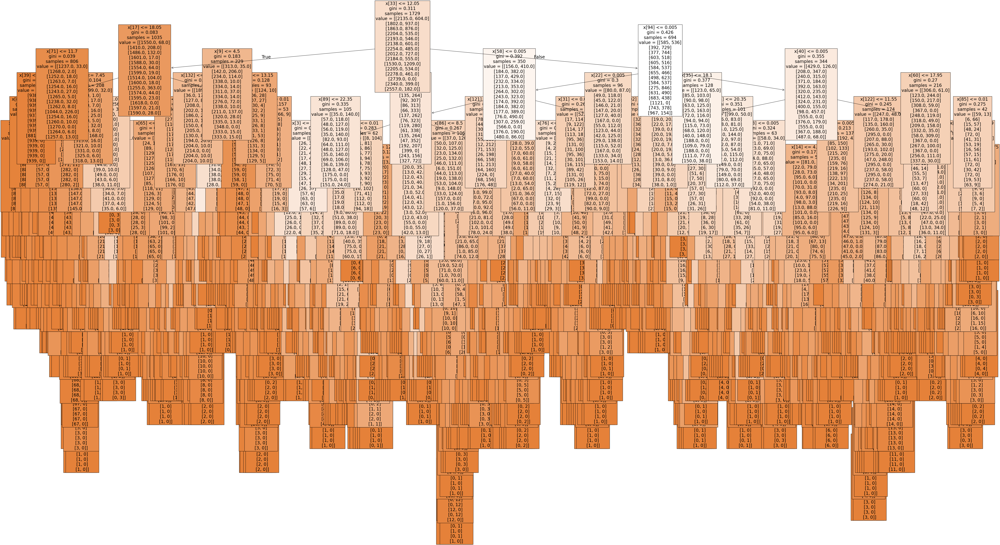

In [39]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, filled=True);

In [40]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(135,)


array([0.00245593, 0.00327841, 0.00294371, 0.0037202 , 0.01489315,
       0.00510684, 0.01744047, 0.00485738, 0.01791143, 0.0035248 ,
       0.00364526, 0.00295478, 0.00352917, 0.01512638, 0.00435999,
       0.01249958, 0.00295456, 0.01099385, 0.00297338, 0.00304162,
       0.00290867, 0.0040061 , 0.01257076, 0.00405655, 0.00669526,
       0.00288093, 0.01811473, 0.00401441, 0.00250771, 0.00572355,
       0.00460738, 0.01332999, 0.00467525, 0.01582095, 0.00263626,
       0.02689819, 0.00535408, 0.00413091, 0.00382856, 0.00468592,
       0.01915   , 0.00946042, 0.02034695, 0.00246238, 0.02196643,
       0.00205471, 0.0030411 , 0.00448198, 0.00342432, 0.00868085,
       0.00357268, 0.0184446 , 0.00490065, 0.01319469, 0.00317298,
       0.00372081, 0.00545862, 0.00331183, 0.0121386 , 0.00429599,
       0.02234496, 0.00732105, 0.03568661, 0.00298736, 0.00373312,
       0.00332951, 0.00437423, 0.01820163, 0.00425057, 0.01461639,
       0.00288192, 0.01216137, 0.00551988, 0.0047225 , 0.00399

In [41]:
# Reshape newarray

newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00245593, 0.00327841, 0.00294371, 0.0037202 , 0.01489315,
         0.00510684, 0.01744047, 0.00485738, 0.01791143],
        [0.0035248 , 0.00364526, 0.00295478, 0.00352917, 0.01512638,
         0.00435999, 0.01249958, 0.00295456, 0.01099385],
        [0.00297338, 0.00304162, 0.00290867, 0.0040061 , 0.01257076,
         0.00405655, 0.00669526, 0.00288093, 0.01811473],
        [0.00401441, 0.00250771, 0.00572355, 0.00460738, 0.01332999,
         0.00467525, 0.01582095, 0.00263626, 0.02689819],
        [0.00535408, 0.00413091, 0.00382856, 0.00468592, 0.01915   ,
         0.00946042, 0.02034695, 0.00246238, 0.02196643],
        [0.00205471, 0.0030411 , 0.00448198, 0.00342432, 0.00868085,
         0.00357268, 0.0184446 , 0.00490065, 0.01319469],
        [0.00317298, 0.00372081, 0.00545862, 0.00331183, 0.0121386 ,
         0.00429599, 0.02234496, 0.00732105, 0.03568661],
        [0.00298736, 0.00373312, 0.00332951, 0.00437423, 0.01820163,
         0.00425057, 0.01461639, 0.0028819

In [42]:
# Collapse this shape into one observation for each weather station

sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.07260753, 0.05958836, 0.05724799, 0.08021369, 0.09138565,
       0.06179559, 0.09745144, 0.0665361 , 0.11423179, 0.06105327,
       0.07006061, 0.05697894, 0.02682065, 0.05132596, 0.03270243])

In [43]:
# Convert the set of unique stations to a list

unique_stations_list = list(unique_stations)

In [44]:
important = pd.Series(sumarray, index = unique_stations_list)
important = important.sort_values(ascending = False)
important

MADRID        0.114232
BUDAPEST      0.097451
HEATHROW      0.091386
DUSSELDORF    0.080214
OSLO          0.072608
MUNCHENB      0.070061
KASSEL        0.066536
MAASTRICHT    0.061796
LJUBLJANA     0.061053
BELGRADE      0.059588
BASEL         0.057248
STOCKHOLM     0.056979
VALENTIA      0.051326
DEBILT        0.032702
SONNBLICK     0.026821
dtype: float64

In [45]:
# Create a df to associate weather stations with their importances

df_importance = pd.DataFrame({
    'Weather Station': unique_stations_list,
    'Importance': sumarray
})

df_importance = df_importance.sort_values(by='Importance', ascending = False)

['OSLO', 'BELGRADE', 'BASEL', 'DUSSELDORF', 'HEATHROW', 'MAASTRICHT', 'BUDAPEST', 'KASSEL', 'MADRID', 'LJUBLJANA', 'MUNCHENB', 'STOCKHOLM', 'SONNBLICK', 'VALENTIA', 'DEBILT']


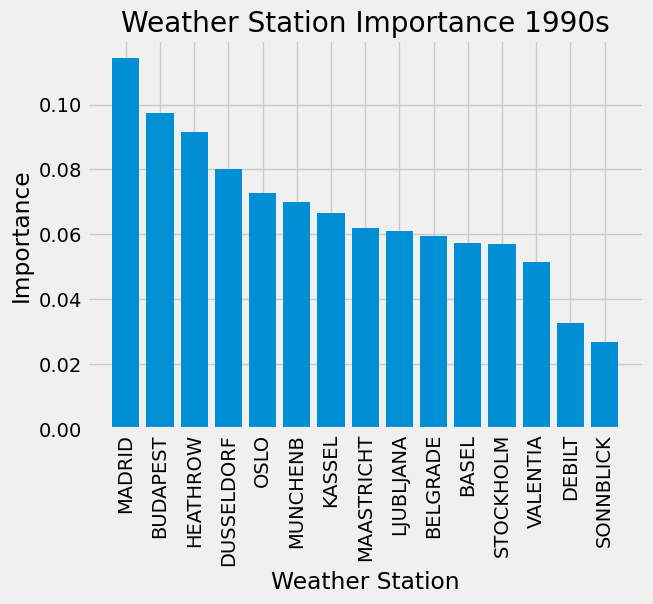

In [46]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
print(unique_stations_list)

plt.bar(df_importance['Weather Station'], df_importance['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Weather Station')
plt.ylabel('Importance')
plt.title('Weather Station Importance 1990s')
plt.show()

In [47]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 50)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=50)

In [48]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.5892661555312158


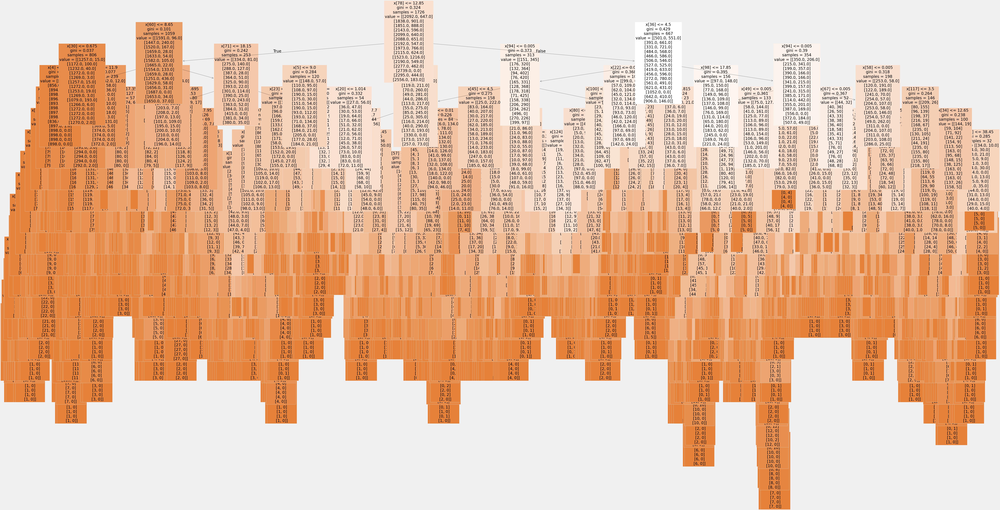

In [49]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[15], fontsize = 20, filled=True);
plt.show()

In [50]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(135,)


array([0.00262242, 0.00325644, 0.00326708, 0.00356274, 0.01253372,
       0.00521271, 0.01648402, 0.00412131, 0.03712465, 0.00401885,
       0.00340426, 0.00382491, 0.00370666, 0.01518587, 0.00461117,
       0.00572784, 0.00266576, 0.00698321, 0.00272772, 0.00303246,
       0.0031335 , 0.00386502, 0.01130335, 0.00448894, 0.01827887,
       0.00718562, 0.00908125, 0.00541788, 0.002029  , 0.00437009,
       0.00330572, 0.01179569, 0.00578919, 0.02705719, 0.00282954,
       0.02940463, 0.00641238, 0.00539747, 0.00302507, 0.00435229,
       0.01645207, 0.00999681, 0.00340974, 0.00228376, 0.04323456,
       0.00186754, 0.00305293, 0.00452077, 0.00331107, 0.0104897 ,
       0.0038477 , 0.01046711, 0.00283205, 0.01290937, 0.00348286,
       0.00368599, 0.00419039, 0.00811149, 0.00834758, 0.00561161,
       0.01617822, 0.00241025, 0.01939943, 0.00366158, 0.00319122,
       0.00302447, 0.00329519, 0.01653619, 0.00513734, 0.00491668,
       0.00273775, 0.01227849, 0.00805905, 0.00393114, 0.00430

In [51]:
# Reshape newarray

newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00262242, 0.00325644, 0.00326708, 0.00356274, 0.01253372,
         0.00521271, 0.01648402, 0.00412131, 0.03712465],
        [0.00401885, 0.00340426, 0.00382491, 0.00370666, 0.01518587,
         0.00461117, 0.00572784, 0.00266576, 0.00698321],
        [0.00272772, 0.00303246, 0.0031335 , 0.00386502, 0.01130335,
         0.00448894, 0.01827887, 0.00718562, 0.00908125],
        [0.00541788, 0.002029  , 0.00437009, 0.00330572, 0.01179569,
         0.00578919, 0.02705719, 0.00282954, 0.02940463],
        [0.00641238, 0.00539747, 0.00302507, 0.00435229, 0.01645207,
         0.00999681, 0.00340974, 0.00228376, 0.04323456],
        [0.00186754, 0.00305293, 0.00452077, 0.00331107, 0.0104897 ,
         0.0038477 , 0.01046711, 0.00283205, 0.01290937],
        [0.00348286, 0.00368599, 0.00419039, 0.00811149, 0.00834758,
         0.00561161, 0.01617822, 0.00241025, 0.01939943],
        [0.00366158, 0.00319122, 0.00302447, 0.00329519, 0.01653619,
         0.00513734, 0.00491668, 0.0027377

In [52]:
# Collapse this shape into one observation for each weather station

sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.0881851 , 0.05012852, 0.06309673, 0.09199891, 0.09456417,
       0.05329825, 0.07141782, 0.05477889, 0.12301146, 0.07500298,
       0.0736417 , 0.05797898, 0.02550092, 0.04942439, 0.02797118])

In [53]:
important = pd.Series(sumarray, index = unique_stations_list)
important = important.sort_values(ascending = False)
important

MADRID        0.123011
HEATHROW      0.094564
DUSSELDORF    0.091999
OSLO          0.088185
LJUBLJANA     0.075003
MUNCHENB      0.073642
BUDAPEST      0.071418
BASEL         0.063097
STOCKHOLM     0.057979
KASSEL        0.054779
MAASTRICHT    0.053298
BELGRADE      0.050129
VALENTIA      0.049424
DEBILT        0.027971
SONNBLICK     0.025501
dtype: float64

In [54]:
# Create a df to associate weather stations with their importances

df_importance = pd.DataFrame({
    'Weather Station': unique_stations_list,
    'Importance': sumarray
})

df_importance = df_importance.sort_values(by='Importance', ascending = False)

['OSLO', 'BELGRADE', 'BASEL', 'DUSSELDORF', 'HEATHROW', 'MAASTRICHT', 'BUDAPEST', 'KASSEL', 'MADRID', 'LJUBLJANA', 'MUNCHENB', 'STOCKHOLM', 'SONNBLICK', 'VALENTIA', 'DEBILT']


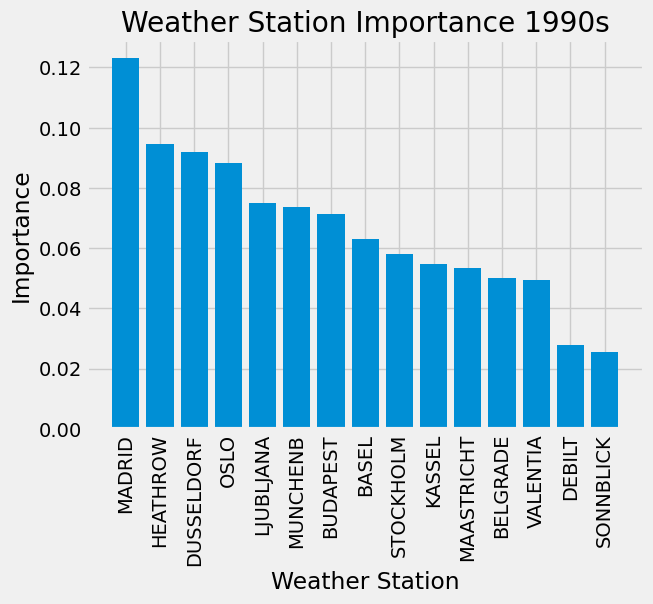

In [55]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
print(unique_stations_list)

plt.bar(df_importance['Weather Station'], df_importance['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Weather Station')
plt.ylabel('Importance')
plt.title('Weather Station Importance 1990s')
plt.show()

## Random Forest Madrid

In [246]:
# Import cleaned weather observations data

climate = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'weather_clean.csv'), index_col = False)

In [248]:
climate.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


### Reduce to Madrid only

In [252]:
# list of the columns containing "Madrid"
madrid_list = list(x for x in climate.columns if x.find('MADRID') >=0)
madrid_list

['MADRID_cloud_cover',
 'MADRID_humidity',
 'MADRID_pressure',
 'MADRID_global_radiation',
 'MADRID_precipitation',
 'MADRID_sunshine',
 'MADRID_temp_mean',
 'MADRID_temp_min',
 'MADRID_temp_max']

In [254]:
# DF of those columns
df_madrid=climate[madrid_list]
df_madrid

,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,6,0.92,1.0260,0.53,0.00,1.4,7.6,4.4,10.8
1,7,0.86,1.0254,0.46,0.00,0.9,9.8,7.4,12.2
2,5,0.90,1.0287,0.63,0.00,2.3,8.6,6.4,10.8
3,0,0.75,1.0281,1.16,0.00,8.7,10.3,4.5,16.1
4,2,0.64,1.0269,1.10,0.00,7.8,12.1,8.2,16.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.52,1.0204,1.89,0.12,5.3,20.0,16.2,23.9
22946,8,0.51,1.0221,1.89,0.12,3.9,19.1,14.7,23.5
22947,8,0.46,1.0186,1.89,0.12,8.1,19.0,15.4,22.6
22948,5,0.66,1.0186,1.89,0.12,3.1,15.7,13.1,18.3


In [256]:
answers.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [258]:
# DF of budapest answers
answers_madrid = answers['MADRID_pleasant_weather']
answers_madrid

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: MADRID_pleasant_weather, Length: 22950, dtype: int64

In [260]:
df_madrid.shape

(22950, 9)

In [262]:
answers_madrid.shape

(22950,)

### reshape

In [264]:
X=df_madrid

In [266]:
y=answers_madrid

In [268]:
# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

In [270]:
X.shape

(22950, 9)

In [272]:
y.shape

(22950,)

### data split

In [274]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [276]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [278]:
X_train

array([[ 4.    ,  0.48  ,  1.0139, ..., 24.8   , 19.    , 30.5   ],
       [ 5.    ,  0.7   ,  1.0192, ...,  5.8   ,  2.7   ,  8.8   ],
       [ 8.    ,  0.91  ,  1.0006, ...,  2.1   ,  0.6   ,  3.6   ],
       ...,
       [ 6.    ,  0.53  ,  1.0147, ..., 18.1   , 13.2   , 23.    ],
       [ 0.    ,  0.45  ,  1.0204, ..., 17.5   , 10.2   , 24.8   ],
       [ 6.    ,  0.74  ,  1.0155, ..., 13.4   ,  9.2   , 17.5   ]])

In [280]:
y_train

array([1, 0, 0, ..., 1, 1, 0], dtype=int64)

In [77]:
X_test

array([[ 4.    ,  0.67  ,  1.017 , ..., 19.4   , 17.8   , 25.4   ],
       [ 1.    ,  0.55  ,  1.0275, ...,  0.1   , -3.5   ,  3.4   ],
       [ 1.    ,  0.61  ,  1.0127, ..., 21.9   , 16.3   , 28.2   ],
       ...,
       [ 4.    ,  0.67  ,  1.017 , ..., 12.    ,  7.4   , 19.5   ],
       [ 3.    ,  0.66  ,  1.0187, ...,  7.2   ,  5.4   ,  9.4   ],
       [ 3.    ,  0.47  ,  1.0142, ..., 26.9   , 19.3   , 32.5   ]])

In [282]:
y_test

array([1, 0, 1, ..., 0, 1, 0], dtype=int64)

### random forest

In [284]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [286]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


In [288]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);

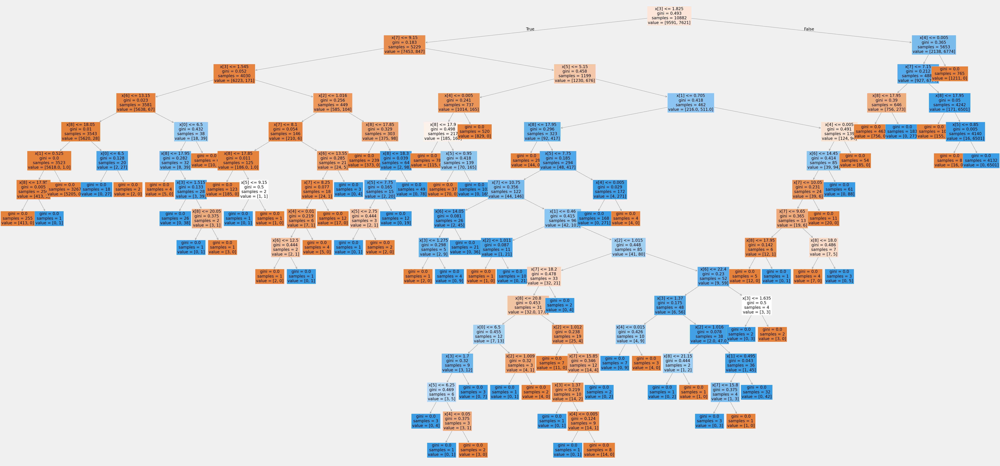

In [290]:
plt.show()

In [292]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.01352755, 0.0212873 , 0.00339825, 0.07750351, 0.22534444,
       0.08137182, 0.23207374, 0.05191417, 0.29357923])

In [296]:
# Create a list of weather features

wx_list = [feature.replace('MADRID_', '') for feature in madrid_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [298]:
important = pd.Series(newarray, index = wx_list)
important

cloud_cover         0.013528
humidity            0.021287
pressure            0.003398
global_radiation    0.077504
precipitation       0.225344
sunshine            0.081372
temp_mean           0.232074
temp_min            0.051914
temp_max            0.293579
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


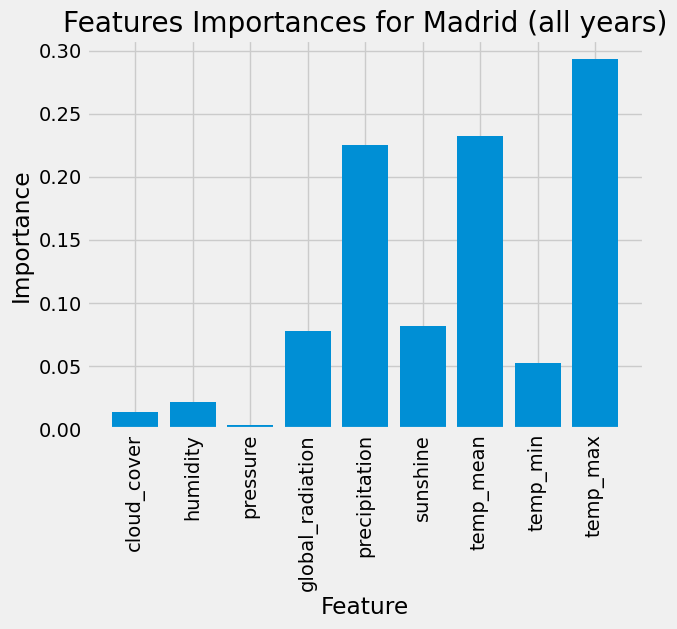

In [300]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for Madrid (all years)');
plt.show()

## Random Forest Heathrow

### Reduce to Heathrow only

In [305]:
# list of the columns containing "Heathrow"
heathrow_list = list(x for x in climate.columns if x.find('HEATHROW') >=0)
heathrow_list

['HEATHROW_cloud_cover',
 'HEATHROW_humidity',
 'HEATHROW_pressure',
 'HEATHROW_global_radiation',
 'HEATHROW_precipitation',
 'HEATHROW_sunshine',
 'HEATHROW_temp_mean',
 'HEATHROW_temp_min',
 'HEATHROW_temp_max']

In [307]:
# DF of those columns
df_heathrow=climate[heathrow_list]
df_heathrow

,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max
0,7,0.91,1.0010,0.13,0.22,0.0,10.6,9.4,8.3
1,7,0.98,1.0051,0.13,0.23,0.0,6.1,3.9,10.6
2,8,0.96,1.0166,0.15,0.07,0.1,8.4,6.1,12.2
3,8,0.98,1.0230,0.13,0.00,0.0,9.4,6.7,8.9
4,5,0.84,1.0275,0.30,0.00,2.1,8.9,8.9,7.2
...,...,...,...,...,...,...,...,...,...
22945,5,0.87,1.0140,1.18,0.16,1.9,16.4,11.9,18.9
22946,4,0.82,1.0152,1.18,0.16,4.2,15.8,12.7,21.8
22947,7,0.85,1.0138,1.18,0.16,4.2,16.5,11.2,17.0
22948,5,0.86,1.0147,1.18,0.16,0.6,15.2,13.4,17.5


In [309]:
# DF of Heathrow answers
answers_heathrow = answers['HEATHROW_pleasant_weather']
answers_heathrow

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: HEATHROW_pleasant_weather, Length: 22950, dtype: int64

In [311]:
df_heathrow.shape

(22950, 9)

In [313]:
answers_heathrow.shape

(22950,)

### reshape

In [322]:
X=df_heathrow

In [324]:
y=answers_heathrow

In [326]:
# Turn X and y from df to arrays

X = np.array(X)
y = np.array(y)

In [328]:
X.shape

(22950, 9)

In [330]:
y.shape

(22950,)

### data split

In [332]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [334]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [336]:
X_train

array([[ 7.    ,  0.77  ,  1.0144, ..., 15.8   , 12.5   , 20.3   ],
       [ 3.    ,  0.71  ,  1.0171, ...,  1.3   , -2.7   ,  7.    ],
       [ 3.    ,  0.81  ,  1.0116, ..., -2.8   , -5.7   ,  0.8   ],
       ...,
       [ 8.    ,  0.9   ,  1.0115, ...,  8.3   ,  6.8   , 12.4   ],
       [ 6.    ,  0.83  ,  1.0121, ..., 11.6   ,  8.1   , 16.8   ],
       [ 2.    ,  0.59  ,  1.0257, ...,  9.2   ,  4.2   , 11.8   ]])

In [338]:
X_test

array([[ 3.    ,  0.61  ,  1.0171, ..., 13.6   ,  8.2   , 18.1   ],
       [ 7.    ,  0.88  ,  0.9977, ...,  5.9   ,  0.8   , 11.1   ],
       [ 7.    ,  0.7   ,  1.0043, ..., 19.4   , 14.6   , 24.6   ],
       ...,
       [ 6.    ,  0.85  ,  1.0095, ..., 15.4   , 12.1   , 21.7   ],
       [ 5.    ,  0.72  ,  1.0264, ...,  8.7   ,  2.9   , 15.    ],
       [ 4.    ,  0.58  ,  1.022 , ..., 14.2   ,  9.9   , 18.6   ]])

In [340]:
y_train

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [342]:
y_test

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

### random forest

In [344]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [346]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


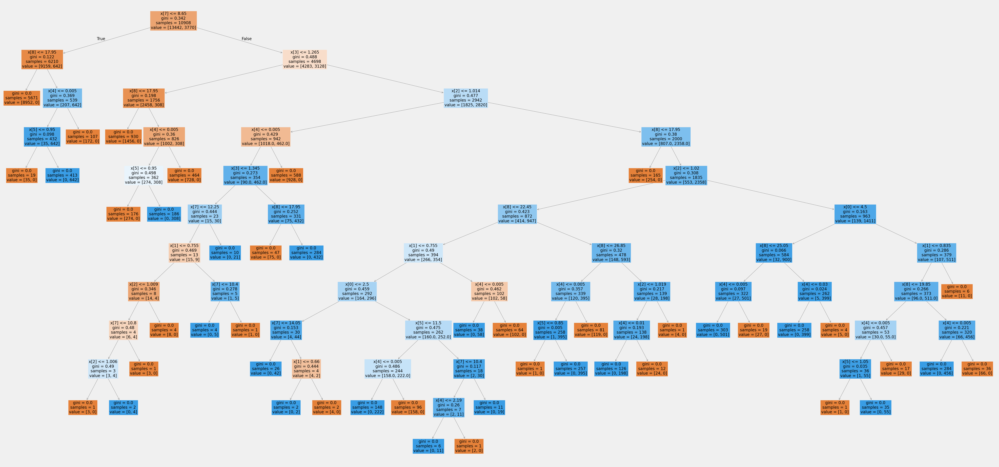

In [348]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);
plt.show()

In [350]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.01386957, 0.04889609, 0.01532584, 0.05927557, 0.30359352,
       0.07920344, 0.12773826, 0.02085383, 0.33124388])

In [352]:
# Create a list of weather features

wx_list = [feature.replace('HEATHROW_', '') for feature in heathrow_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [354]:
important = pd.Series(newarray, index = wx_list)
important

cloud_cover         0.013870
humidity            0.048896
pressure            0.015326
global_radiation    0.059276
precipitation       0.303594
sunshine            0.079203
temp_mean           0.127738
temp_min            0.020854
temp_max            0.331244
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


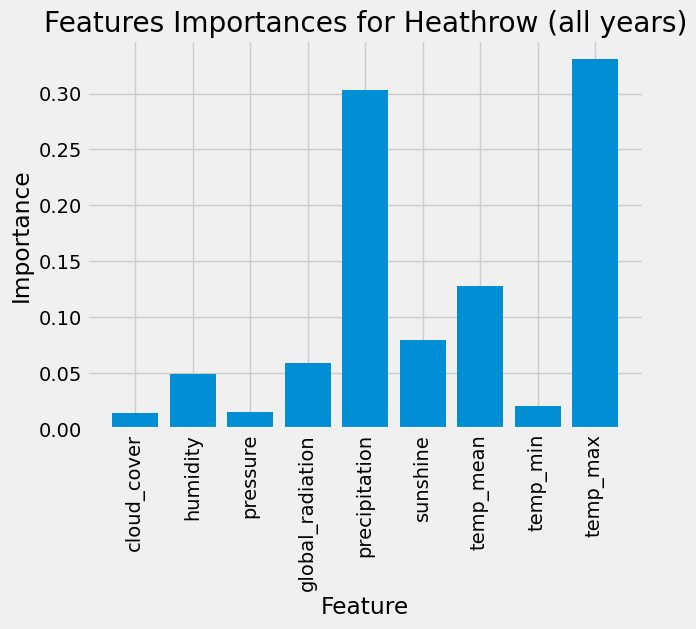

In [356]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for Heathrow (all years)');
plt.show()

## Random Forest Dusseldorf

### Reduce to Dusseldorf only

In [361]:
# list of the columns containing "Dusseldorf"
dusseldorf_list = list(x for x in climate.columns if x.find('DUSSELDORF') >=0)
dusseldorf_list

['DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_sunshine',
 'DUSSELDORF_temp_mean',
 'DUSSELDORF_temp_min',
 'DUSSELDORF_temp_max']

In [363]:
# DF of those columns
df_dusseldorf=climate[dusseldorf_list]
df_dusseldorf

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.0214,1.13,0.20,6.4,17.8,13.6,21.4
22946,7,0.71,1.0186,1.13,0.20,4.9,19.4,15.4,23.9
22947,8,0.73,1.0196,1.13,0.20,4.0,18.2,13.4,22.0
22948,7,0.73,1.0176,1.13,0.20,6.9,16.7,11.9,21.1


In [365]:
# DF of Dusseldorf answers
answers_dusseldorf = answers['DUSSELDORF_pleasant_weather']
answers_dusseldorf

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: DUSSELDORF_pleasant_weather, Length: 22950, dtype: int64

In [367]:
df_dusseldorf.shape

(22950, 9)

In [371]:
answers_dusseldorf.shape

(22950,)

### data split

In [374]:
X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [376]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [378]:
X_test

array([[ 3.    ,  0.61  ,  1.0171, ..., 13.6   ,  8.2   , 18.1   ],
       [ 7.    ,  0.88  ,  0.9977, ...,  5.9   ,  0.8   , 11.1   ],
       [ 7.    ,  0.7   ,  1.0043, ..., 19.4   , 14.6   , 24.6   ],
       ...,
       [ 6.    ,  0.85  ,  1.0095, ..., 15.4   , 12.1   , 21.7   ],
       [ 5.    ,  0.72  ,  1.0264, ...,  8.7   ,  2.9   , 15.    ],
       [ 4.    ,  0.58  ,  1.022 , ..., 14.2   ,  9.9   , 18.6   ]])

In [380]:
X_train

array([[ 7.    ,  0.77  ,  1.0144, ..., 15.8   , 12.5   , 20.3   ],
       [ 3.    ,  0.71  ,  1.0171, ...,  1.3   , -2.7   ,  7.    ],
       [ 3.    ,  0.81  ,  1.0116, ..., -2.8   , -5.7   ,  0.8   ],
       ...,
       [ 8.    ,  0.9   ,  1.0115, ...,  8.3   ,  6.8   , 12.4   ],
       [ 6.    ,  0.83  ,  1.0121, ..., 11.6   ,  8.1   , 16.8   ],
       [ 2.    ,  0.59  ,  1.0257, ...,  9.2   ,  4.2   , 11.8   ]])

In [382]:
y_test

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [384]:
y_train

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

### random forest

In [386]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

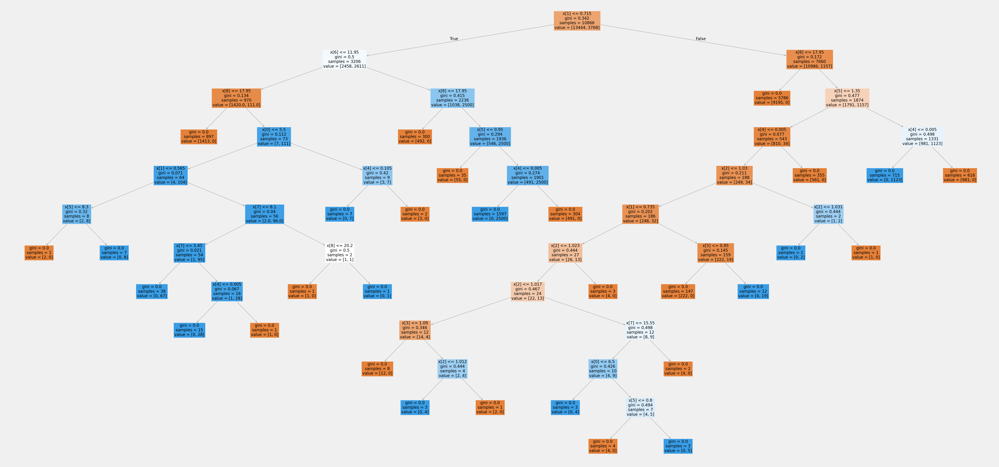

In [388]:
# Class-names = {0:'Unpleasant Weather', 1:'Pleasant Weather'}

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[6], fontsize = 20, filled=True);
plt.show()

In [390]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape)
newarray

(9,)


array([0.01488295, 0.04303407, 0.02298131, 0.07644806, 0.3021685 ,
       0.07816228, 0.1324527 , 0.00929091, 0.3205792 ])

In [394]:
# Create a list of weather features

wx_list = [feature.replace('DUSSELDORF_', '') for feature in dusseldorf_list]
wx_list

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [396]:
important = pd.Series(newarray, index = wx_list)
important

cloud_cover         0.014883
humidity            0.043034
pressure            0.022981
global_radiation    0.076448
precipitation       0.302169
sunshine            0.078162
temp_mean           0.132453
temp_min            0.009291
temp_max            0.320579
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


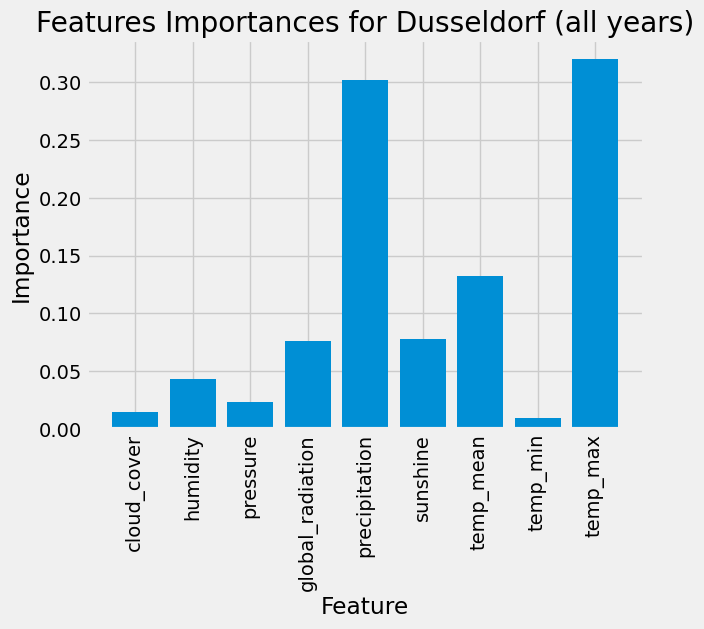

In [398]:
# Plot the results

%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(newarray)))
print(wx_list)

plt.bar(x_values, newarray, orientation = 'vertical')
plt.xticks(x_values, wx_list, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Features Importances for Dusseldorf (all years)');
plt.show()